In [1]:
# IMPORT LIBRARIES AND INITIAL CLEANED DATAFRAME (FROM LYNN)
import math
import pandas as pd
import numpy as np
import scipy.stats as stats

from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error,r2_score


import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import seaborn as sns

In [2]:
# IMPORT DATA
data = pd.read_csv('data\clean_data.csv').to_numpy()
X = data[:,:-1]
y = data[:,-1]
# for ii in range(len(y)):
#     if y[ii] < 100000:
#         y[ii] = 100000
nX = preprocessing.scale(X)
ny = preprocessing.scale(y)

# ADD SOME VISUALS HERE TO INVESTIGATE THE DATAFRAME (PCA)
pca_data = PCA(n_components=2)
pdata = pca_data.fit_transform(nX)
# print(np.shape(X))
# print(np.shape(data))
print(ny)

[-0.138654   -0.15654336  5.7670885  ... -0.15107717 -0.1686672
 -0.12710044]


[[-1.8929546  -0.23973753]
 [-2.25298696 -0.32948794]
 [-2.47421712 -0.32039146]
 ...
 [-1.35387615 -0.10638764]
 [-1.25944647 -0.04060297]
 [-0.36749973  0.0364603 ]]


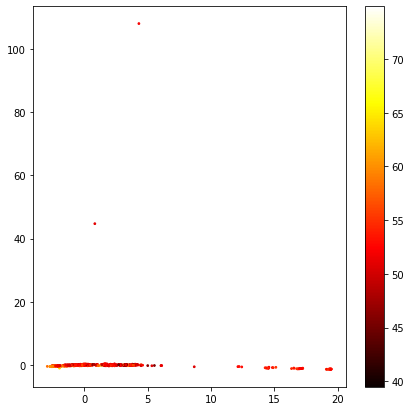

In [3]:
print(pdata)
fig,ax=plt.subplots(1,1,figsize=[7,7])
# ax.scatter(pdata[:,0],y)
sc=ax.scatter(pdata[:,0],pdata[:,1],c=10*np.log10(y),s=3,cmap='hot')
plt.colorbar(sc)
# plt.ylim([-15,10])
# print(np.max(y))
# print(np.min(y))
# # ax.colorbar()

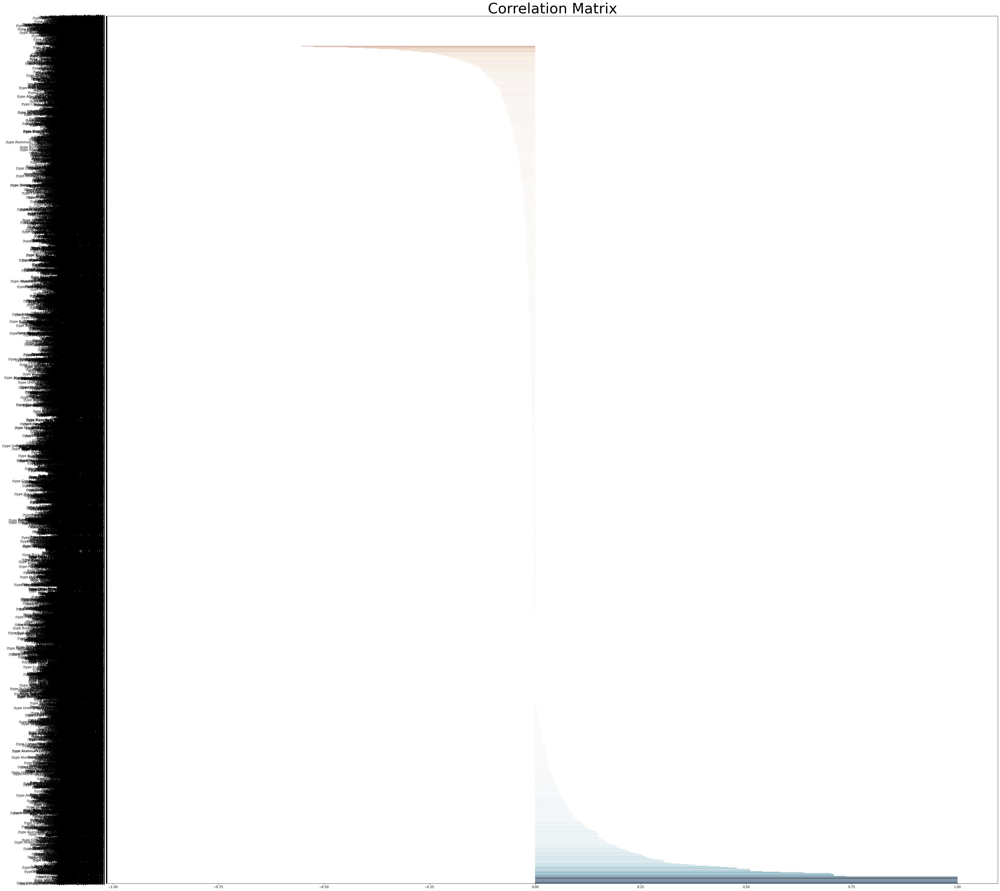

Text(0.5, 1.0, 'Correlation Matrix')

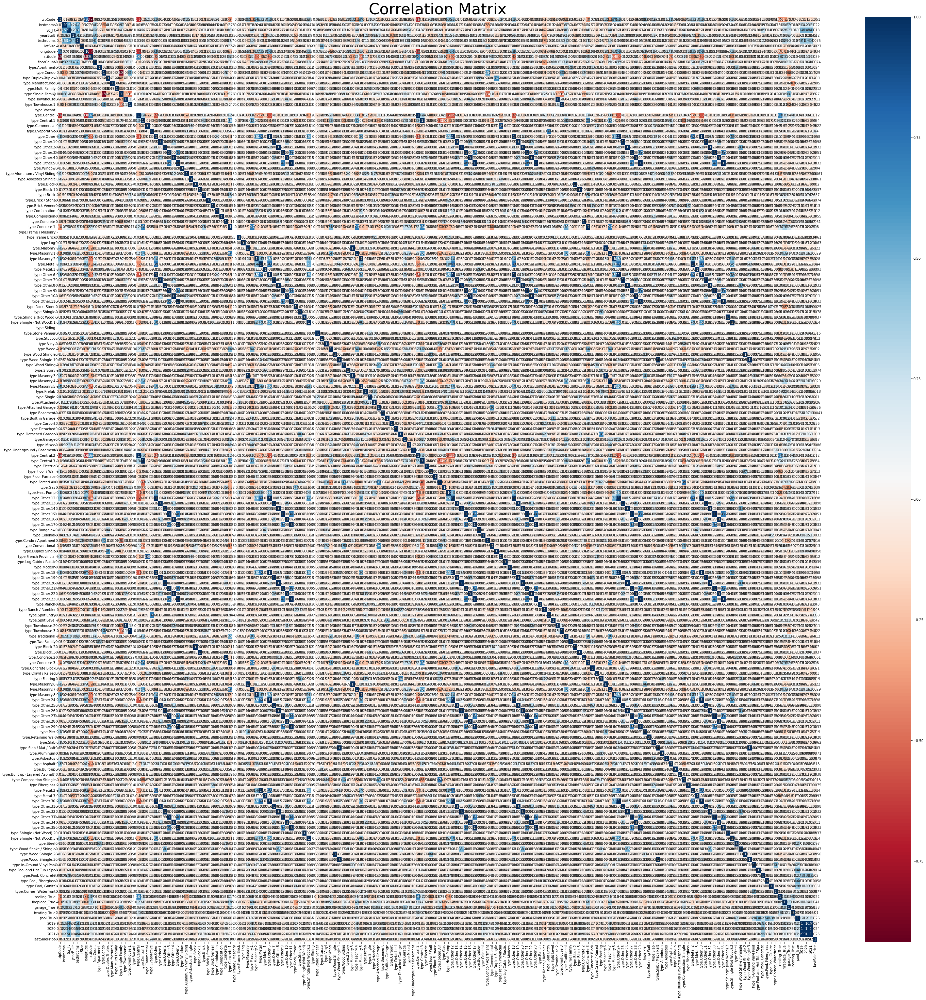

In [4]:
# CREATE A CORRELATION MATRIX, INVESTIGATE, AND REMOVE CORRELATED VARIABLES


#put data in to a data frame for analysis; separate out the prediction/sale value
#did the same thing as what Lynn did above, just as a dataframe.

df = pd.read_csv('data\clean_data.csv')
df = df.drop(columns=['Unnamed: 0'])


X = df.iloc[:,:-1]
y = df.iloc[:,-1]

x_col = X.columns
y_col = y.name


nX = pd.DataFrame(preprocessing.scale(X),columns=x_col)
ny = preprocessing.scale(y)

#Set up for bar graphs for COR matrix

def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns

    for i in range(0,df.shape[1]):
        for j in range(0,i+1):
            pairs_to_drop.add((cols[i],cols[j]))
    return pairs_to_drop

def get_correlations(df):
    au_corr = df.corr().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr =au_corr.drop(labels=labels_to_drop).sort_values(ascending = False)
    return au_corr

corrplot = get_correlations(nX)



fig,ax = plt.subplots(figsize=(50,50))
norm = TwoSlopeNorm(vmin=-1, vcenter = 0, vmax = 1)
colors = [plt.cm.RdBu(norm(c)) for c in corrplot.values]

corrplot.plot.barh(color=colors)
plt.title("Correlation Matrix",fontsize= 45)
plt.show()


corrMatrix = nX.corr()

#Shouldn't need these; went a different route, but will leave in place for now.

#a_corrMatrix = corrMatrix[(corrMatrix > 0.59).any(1)]
#b_corrMatrix = corrMatrix[(corrMatrix < -0.59).any(1)]


#Look at parameters with higher than 0.6 Co-variance or less than -0.6; decide which we want to keep.
#put to a list for use; will remove any combinations that are the same features.

pos_cov_list = corrMatrix[corrMatrix > 0.6].stack().index.tolist()
neg_cov_list = corrMatrix[corrMatrix < -0.6].stack().index.tolist()


pos_new_list = []
neg_new_list = []


for ind,val in enumerate(pos_cov_list):
    
    if pos_cov_list[ind][0] != pos_cov_list[ind][1]:
        pos_new_list.append(val)
    
    
for ind,val in enumerate(neg_new_list):
    if neg_cov_list[ind][0] != neg_cov_list[ind][1]:
        neg_new_list.append(val)


#For future use; combining the two lists of features to remove.

#aa_new_list = a_new_list + b_new_list
#aaa_new_list = a_new_list.append(b_new_list)


sns.color_palette("Spectral", as_cmap=True)
plt.rcParams["figure.figsize"] = (50,50)
sns.heatmap(corrMatrix, annot=True, cmap="RdBu")
plt.title("Correlation Matrix",fontsize= 45)
#plt.show()

# LASSO REGRESSION TO REDUCE VARIABLES

# IMPLEMENT MORE VISUALS FOR UPDATED DATAFRAME (PCA)

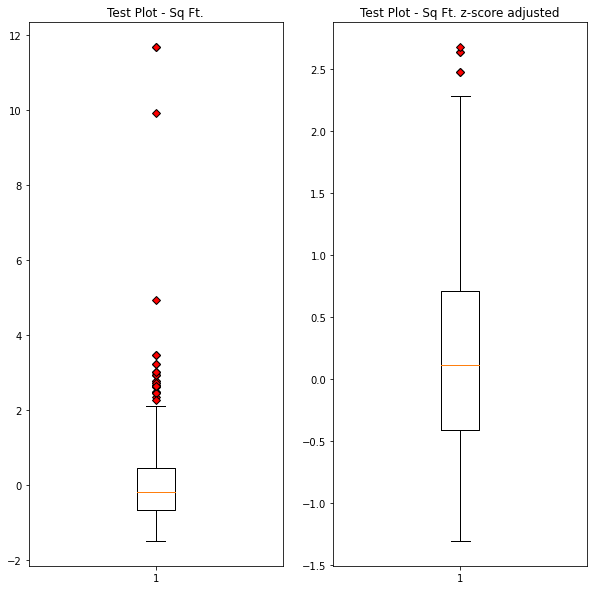

In [5]:
# IMPLEMENT Z-Test TO REMOVE OUTLIERS

#If we want, we could visualize some of the features with a box and whisker plot
# Would want to iterate through. Could look at the remaining features from Lasso
# And compare pre/post removing rows that are dropped after z-score analysis   

#a_nX and y_1 used as was encountering some issues with dropped values when re-running.

a_nX = nX
y_1 = y


cols = list(df.columns)

out_mark = dict(markerfacecolor='r', marker='D')
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(10,10))
ax1.set_title("Test Plot - Sq Ft.")
ax1.boxplot(a_nX['Sq_Ft'],flierprops=out_mark)

z_scores = []

for i,col in enumerate(nX):
    z_scores.append(stats.zscore(nX[col].dropna()))






#check to ensure col/row lengths are correct.
 
#print(len(z_scores))
#print(a_nX.shape[0])

#nx_list holds rows to remove; z-score values greater than 3 or less than -3.
#remove rows from both our "X" and our "y"

nx_list = []

for i in range(len(z_scores)-1):
    for j in range(a_nX.shape[0]-1):
        if z_scores[i][j] > 3 or z_scores[i][j] < -3:
            nx_list.append(j)

a_nX = a_nX.drop(a_nX.index[nx_list])

y_1 = y_1.drop(y_1.index[nx_list])

out_mark = dict(markerfacecolor='r', marker='D')

ax2.set_title("Test Plot - Sq Ft. z-score adjusted")
ax2.boxplot(a_nX['Sq_Ft'],flierprops=out_mark)
plt.show()



In [6]:
# LASSO REGRESSION TO REDUCE VARIABLES

#change variables back to more common notation. 
nX = a_nX
y = y_1

X_train, X_test, y_train, y_test = train_test_split(nX, y, test_size=0.33, random_state=2)
features = list(nX.columns)

pipeline = Pipeline([('scaler',StandardScaler()),('model',Lasso())])

#Can change verbose; I just wanted to see it run. Can adjust alpha ranges. alpha of 2497 was 'best'; ran up to 10,000. 
#Reduced back to 1,000 (10,000 runs for a long time, and 3,000 reduced variables down to only 8 features, which seemed... low.)
search = GridSearchCV(pipeline,{'model__alpha':np.arange(0,1000,1)},
                      cv = 10, scoring="neg_mean_squared_error",verbose=3
                      )

search.fit(X_train,y_train)
alpha_lasso = search.best_params_

coefficients = search.best_estimator_.named_steps['model'].coef_
importance = np.abs(coefficients)
remaining_feat = np.array(features)[importance > 0]

#list of parameters to check for use. commented out unless needed to check.

#model_keys =list(pipeline.get_params().keys())


Fitting 10 folds for each of 1000 candidates, totalling 10000 fits
[CV 1/10] END ................................model__alpha=0; total time=   0.0s
[CV 2/10] END ................................model__alpha=0; total time=   0.0s
[CV 3/10] END ................................model__alpha=0; total time=   0.0s
[CV 4/10] END ................................model__alpha=0; total time=   0.0s
[CV 5/10] END ................................model__alpha=0; total time=   0.0s
[CV 6/10] END ................................model__alpha=0; total time=   0.0s
[CV 7/10] END ................................model__alpha=0; total time=   0.0s
[CV 8/10] END ................................model__alpha=0; total time=   0.0s
[CV 9/10] END ................................model__alpha=0; total time=   0.0s
[CV 10/10] END ...............................model__alpha=0; total time=   0.0s
[CV 1/10] END ................................model__alpha=1; total time=   0.0s
[CV 2/10] END ............................

C:\Users\BDany\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\pipeline.py:346: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  self._final_estimator.fit(Xt, y, **fit_params_last_step)
C:\Users\BDany\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\linear_model\_coordinate_descent.py:530: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
C:\Users\BDany\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\pipeline.py:346: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  self._final_estimator.fit(Xt, y, **fit_p

[CV 1/10] END ................................model__alpha=3; total time=   0.0s
[CV 2/10] END ................................model__alpha=3; total time=   0.0s
[CV 3/10] END ................................model__alpha=3; total time=   0.0s
[CV 4/10] END ................................model__alpha=3; total time=   0.0s
[CV 5/10] END ................................model__alpha=3; total time=   0.0s
[CV 6/10] END ................................model__alpha=3; total time=   0.0s
[CV 7/10] END ................................model__alpha=3; total time=   0.0s
[CV 8/10] END ................................model__alpha=3; total time=   0.0s
[CV 9/10] END ................................model__alpha=3; total time=   0.0s
[CV 10/10] END ...............................model__alpha=3; total time=   0.0s
[CV 1/10] END ................................model__alpha=4; total time=   0.0s
[CV 2/10] END ................................model__alpha=4; total time=   0.0s
[CV 3/10] END ..............

In [13]:
# IMPLEMENT MORE VISUALS FOR UPDATED DATAFRAME (PCA)
feat_list = list(remaining_feat)
feat_list.append('2019')
feat_list.append('2020')

model_data = nX[feat_list]

pca_data = PCA(n_components=5)
pdata = pca_data.fit_transform(model_data)

In [8]:
# SPLIT DATASET INTO TEST, TRAIN, AND VALIDATION
feat_list = list(remaining_feat)
model_data = nX[feat_list]


# ARIMA MODEL INITIALIZATION

# GBM MODEL INITIALIZATION

# NEURAL NETWORK MODEL INITIALIZATION

In [9]:
# IMPLEMENT GRIDSEARCH CSV FOR HYPERPARAMETER TUNING

In [10]:
# INVESTIGATE OUTPUT

In [11]:
# FINALIZE MODEL VISUALIZATIONS